## Problem Statement

In the rapidly evolving world of eCommerce, accurate product categorization is crucial for ensuring seamless customer experiences, reducing search friction, and increasing product discoverability. However, the sheer volume of diverse products poses a significant challenge. Current classification systems struggle to handle ambiguities, unconventional naming conventions, and multi-language data. This hackathon aims to address these challenges by inviting participants to create innovative solutions that enhance product categorization efficiency, accuracy, and scalability.

**Objective**: Develop a text classification model that categorizes products with maximum accuracy based on the product description.

## Objectives

This hackathon focuses on creating accurate and efficient solutions for eCommerce product categorization. The key objectives are:

### 1. Data Exploration and Preparation
- Explore and analyze the dataset to understand key features, detect missing data, and identify ambiguities.
- Preprocess the dataset for consistency, noise reduction, and missing value handling.

### 2. Descriptive Analysis
- Perform descriptive analysis to identify data patterns, category distributions, and inconsistencies, especially for text data.
- Visualize data insights using word clouds and other text visualization techniques.

### 3. Feature Engineering/Text to Features
- Transform raw product data into informative features suitable for machine learning models.
- Convert text descriptions into numerical features using techniques such as TF-IDF, word embeddings, or custom methods.

### 4. Predictive Modeling
- Design and develop machine learning models using text data for accurate product categorization.
- Consider classification, clustering, or hybrid models based on problem requirements.
- Ensure the model can handle ambiguous products.

### 5. Fine Tuning
- Optimize models by tuning hyperparameters and selecting relevant features.
- Evaluate and compare models using metrics such as accuracy, F1 score, precision, and recall.
- Validate models through cross-validation or a separate test dataset.

### 6. Enhance Categorization Accuracy
- Improve model accuracy by incorporating domain-specific knowledge or ensemble methods.
- Ensure solutions can accurately categorize unconventional product names and handle ambiguities.
- Develop models that support scalable, real-time categorization.

## Expected Outcomes

By the end of the hackathon, participants are expected to deliver the following outcomes:

### 1. Predictive Model
- A text-based predictive machine learning model capable of accurate product categorization across multiple categories.
- The model will be evaluated using accuracy, F1 score, precision, and recall, ensuring high classification performance.

### 2. Visualizations
- A comprehensive set of visualizations will accompany the model, providing insights into data patterns, category distributions, word clouds, etc.





# importing the libraries

In [14]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import LabelEncoder
import pickle
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

In [15]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from sklearn import metrics
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# 1. Analyze the Dataset:

In [72]:
df=pd.read_csv('/content/train_product_data.csv')

In [73]:
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,Footwear,SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
2,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
3,ce5a6818f7707e2cb61fdcdbba61f5ad,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVVKRBAXHB,1199.0,479.0,"[""http://img6a.flixcart.com/image/short/p/j/z/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,29c8d290caa451f97b1c32df64477a2c,2016-03-25 22:59:23 +0000,http://www.flipkart.com/dilli-bazaaar-bellies-...,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,SHOEH3DZBFR88SCK,699.0,349.0,"[""http://img6a.flixcart.com/image/shoe/b/p/n/p...",False,"Key Features of dilli bazaaar Bellies, Corpora...",No rating available,No rating available,dilli bazaaar,"{""product_specification""=>[{""key""=>""Occasion"",..."


In [74]:
df.shape

(14999, 15)

In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  14999 non-null  object 
 1   crawl_timestamp          14999 non-null  object 
 2   product_url              14999 non-null  object 
 3   product_name             14999 non-null  object 
 4   product_category_tree    14999 non-null  object 
 5   pid                      14999 non-null  object 
 6   retail_price             14942 non-null  float64
 7   discounted_price         14942 non-null  float64
 8   image                    14996 non-null  object 
 9   is_FK_Advantage_product  14999 non-null  bool   
 10  description              14998 non-null  object 
 11  product_rating           14999 non-null  object 
 12  overall_rating           14999 non-null  object 
 13  brand                    10289 non-null  object 
 14  product_specifications

In [76]:
df.describe()

,retail_price,discounted_price
count,14942.000000,14942.000000
mean,3128.424040,2087.732298
std,9154.463342,7712.247869
min,35.000000,35.000000
25%,699.000000,349.000000
50%,1000.000000,499.000000
75%,1989.750000,999.000000
max,571230.000000,571230.000000


In [77]:
x=['product_category_tree','description']

In [78]:
df1=df[x]
df1.head()

,product_category_tree,description
0,Clothing,Key Features of Alisha Solid Women's Cycling S...
1,Footwear,Key Features of AW Bellies Sandals Wedges Heel...
2,Clothing,Key Features of Alisha Solid Women's Cycling S...
3,Clothing,Key Features of Alisha Solid Women's Cycling S...
4,Footwear,"Key Features of dilli bazaaar Bellies, Corpora..."


# EDA

# handling the missing values

In [79]:
df1.isnull().sum()

,0
product_category_tree,0
description,1


In [80]:
df1.dropna(inplace=True)

In [81]:
df1.isnull().sum()

,0
product_category_tree,0
description,0


In [82]:
df1.shape

(14998, 2)

In [83]:
df1.describe()

,product_category_tree,description
count,14998,14998
unique,14,13163
top,Clothing,Fashion Jewellery Alloy Necklace - Buy Fashion...
freq,5315,38


### here we creating a table for finding the percentage of ech category in total

In [28]:
# here firstly create a table values count and store in a varible
SS = df1['product_category_tree'].value_counts()
# Convert to DataFrame by reset the index
SS_df = SS.reset_index()
SS_df.columns = ['Product_Category', 'Count']
# here we add the percentage columns for data distribution
SS_df['percentage']=round((SS_df['Count']/SS_df['Count'].sum())*100,2)
SS_df

,Product_Category,Count,percentage
0,Clothing,5315,35.44
1,Jewellery,3218,21.46
2,Footwear,1083,7.22
3,Automotive,937,6.25
4,Mobiles & Accessories,768,5.12
5,Home Decor & Festive Needs,714,4.76
6,Kitchen & Dining,610,4.07
7,Computers,531,3.54
8,Watches,526,3.51
9,Tools & Hardware,379,2.53


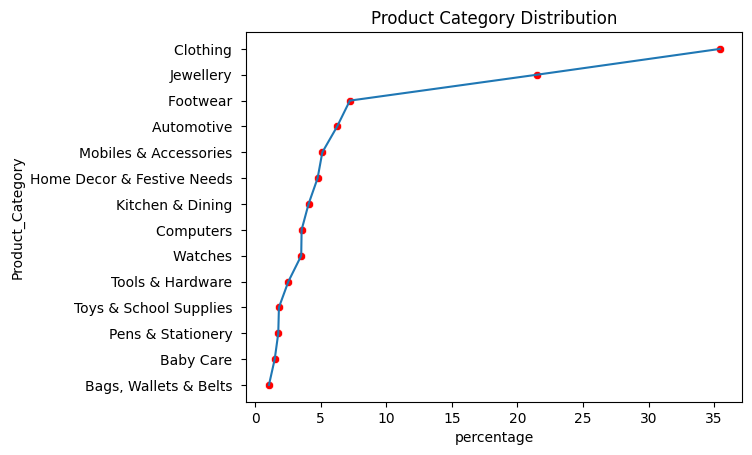

In [ ]:
# plt.figure(figsize=(5,5))
sns.lineplot(SS_df,x='percentage',y='Product_Category',)
sns.scatterplot(SS_df,x='percentage',y='Product_Category',color='red')
plt.title('Product Category Distribution')
plt.show()

# 2. Visualize the Data:

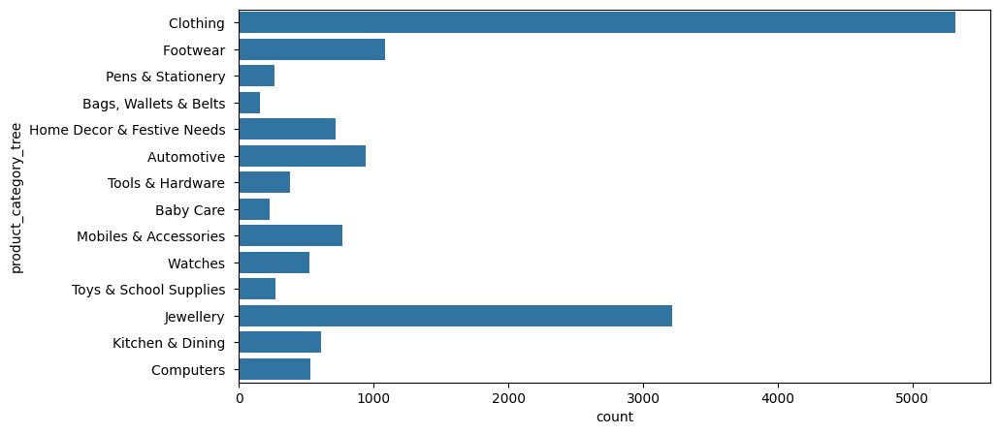

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(df1['product_category_tree'])
plt.show()

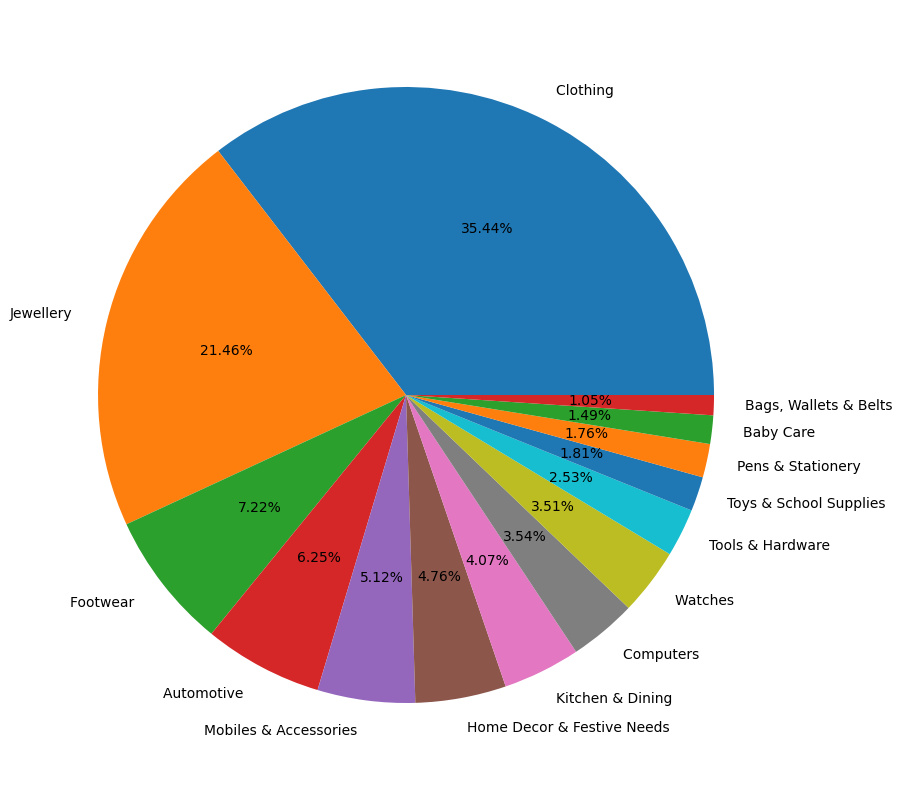

In [ ]:
plt.figure(figsize=(10,10))
plt.pie(df1['product_category_tree'].value_counts(),labels=df1['product_category_tree'].value_counts().index,autopct='%1.2f%%')
plt.show()

In [ ]:
cat_t=df1['product_category_tree'].unique()


array(['Clothing ', 'Footwear ', 'Pens & Stationery ',
       'Bags, Wallets & Belts ', 'Home Decor & Festive Needs ',
       'Automotive ', 'Tools & Hardware ', 'Baby Care ',
       'Mobiles & Accessories ', 'Watches ', 'Toys & School Supplies ',
       'Jewellery ', 'Kitchen & Dining ', 'Computers '], dtype=object)

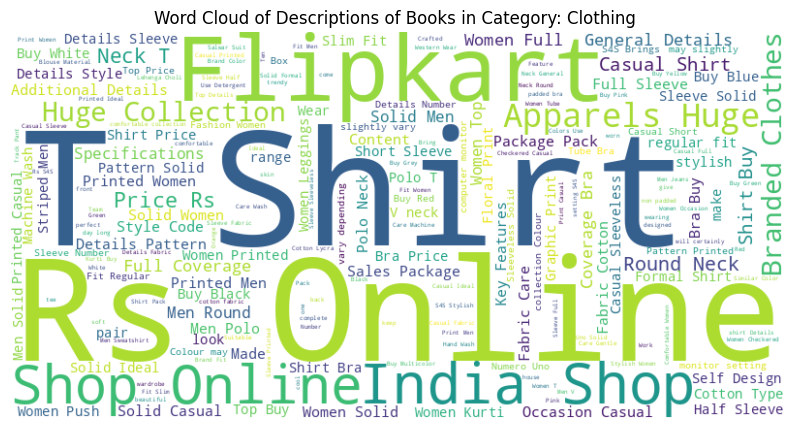

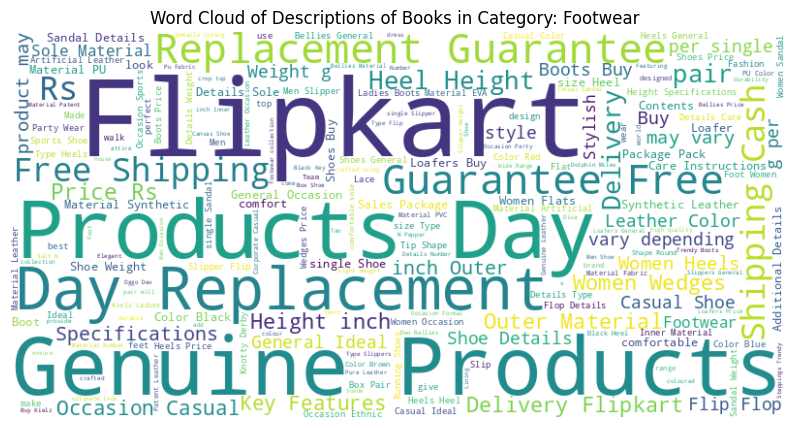

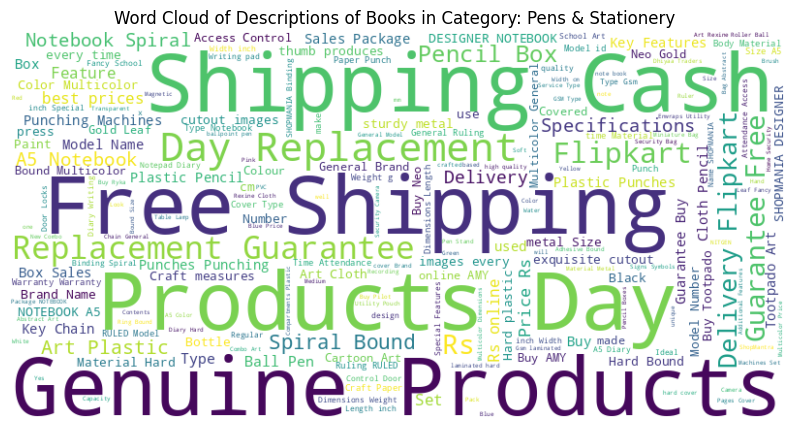

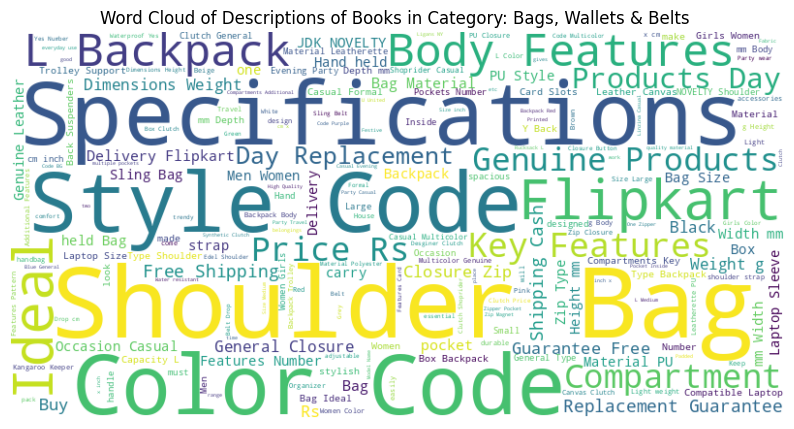

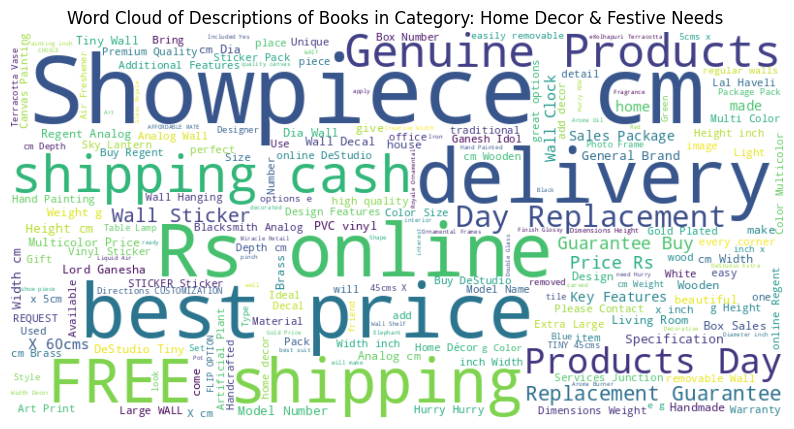

...

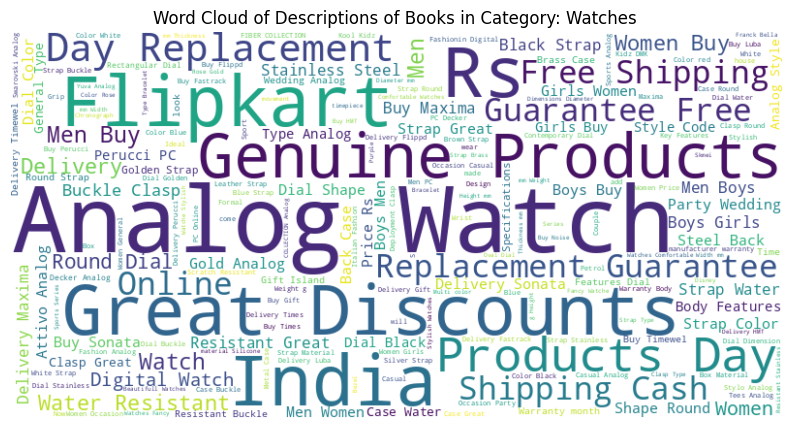

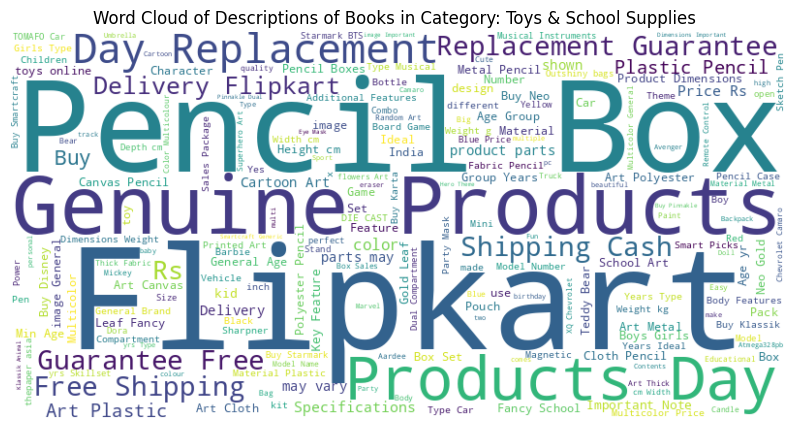

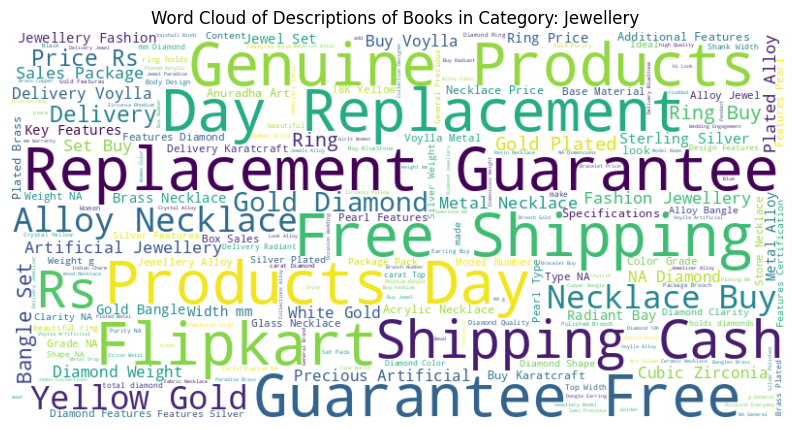

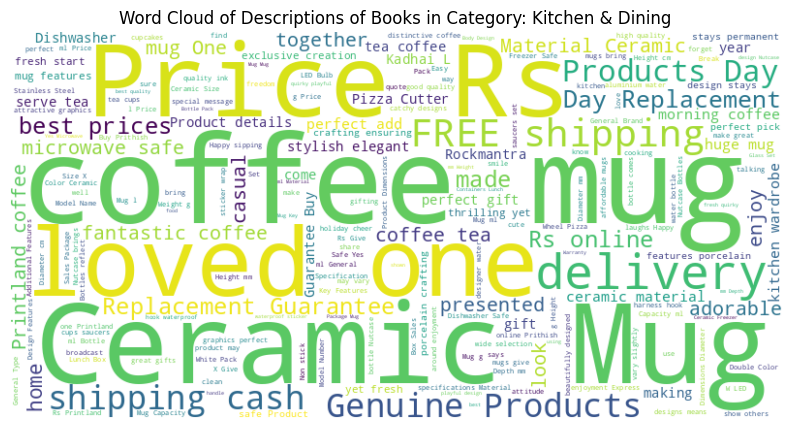

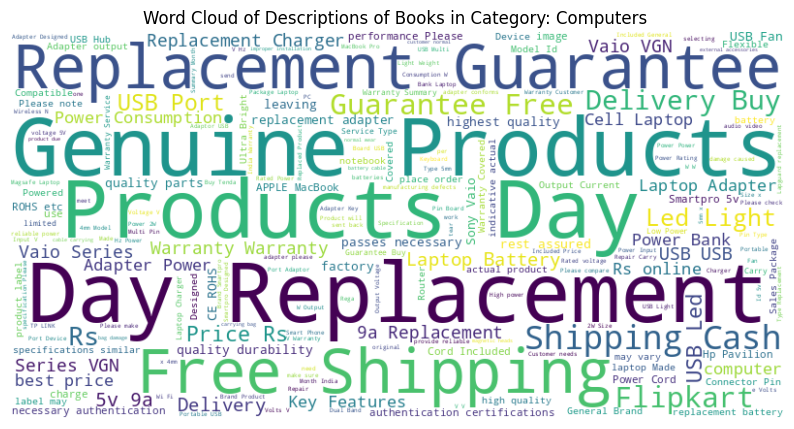

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Assuming 'cat_t' is a list of unique product categories
cat_t = df1['product_category_tree'].unique()

for i in cat_t:
    # Word cloud for book descriptions in each category
    all_text = ' '.join(df1[df1['product_category_tree'] == i]['description'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)

    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud of Descriptions of Books in Category: {i}')
    plt.axis('off')
    plt.show()


# 3 Data preprocessing

cleaning the data here by using the [spacy](https://spacy.io/) library which is use here for text data cleanig

In [84]:
import re
import spacy

# Load spaCy's English language model
nlp = spacy.load('en_core_web_sm')

def clean_text(text):
    """
    Clean and preprocess text using spaCy and regular expressions.

    Parameters:
    text (str): The input text to be cleaned.

    Returns:
    str: The cleaned and preprocessed text.
    """
    # Converting to lowercase
    text = text.lower()

    # Removing special characters
    text = re.sub(r'[^a-z\s]', '', text)

    # Handling empty strings
    if not text.strip():
        return ''

    # Using spaCy to lemmatize, remove stop words, and punctuations
    doc = nlp(text)
    tokens = []
    for token in doc:
      if not token.is_stop and not token.is_punct:
        tokens.append(token.lemma_)
    cleaned_text = ' '.join(tokens)

    return cleaned_text





The clean txt function is use to clean the text like
* It convert the all word into small leter by usning the simple lower finction
* then remove the all special word from the text dataset
* Using spaCy to **[lemmatize](https://www.geeksforgeeks.org/python-lemmatization-with-nltk/)**, remove **[stop words](https://www.coursera.org/articles/what-are-stop-words)**, and [punctuations](https://www.geeksforgeeks.org/how-to-remove-punctuations-in-nltk/)


In [85]:
df1['description']=df1['description'].apply(clean_text)

In [86]:
df1.head()

,product_category_tree,description
0,Clothing,key feature alisha solid women cycling short c...
1,Footwear,key feature aw belly sandal wedge heel casuals...
2,Clothing,key feature alisha solid women cycling short c...
3,Clothing,key feature alisha solid women cycling short c...
4,Footwear,key feature dilli bazaaar belly corporate casu...


### here apply the clean text function on the description columns for data cleaning

# Encoding
Encoding the categorical data into the numerical by the help of using the sklearn function label encoder

In [87]:

lebel_encoder=LabelEncoder()
df1['product_category_tree']=lebel_encoder.fit_transform(df1['product_category_tree'])

df1['product_category_tree'].value_counts()
op=open('label_encoder1.pkl','wb')
pickle.dump(lebel_encoder,op)
op.close()

 # 4. Feature Engineering/Text to Features:

## Split the dataset into independent and dependent features

### Convert text to numerical representation using TF-IDF


In [88]:
# Convert text to numerical representation using TF-IDF
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df1['description'])
y = df1['product_category_tree']



In [89]:
# Preprocessing
X1 = df1['description']
y1 = df1['product_category_tree']

In [90]:
# Check the feature size of the vectorizer
print(f"Feature size of the vectorizer: {len(vectorizer.get_feature_names_out())}")
# Check the feature size of the vectorizer


Feature size of the vectorizer: 16307


* This line creates an instance of the TfidfVectorizer class.
* This instance will be used to transform the text data into a numerical representation using the TF-IDF (Term Frequency-Inverse Document Frequency) method.

# 5. Address Class Imbalance:

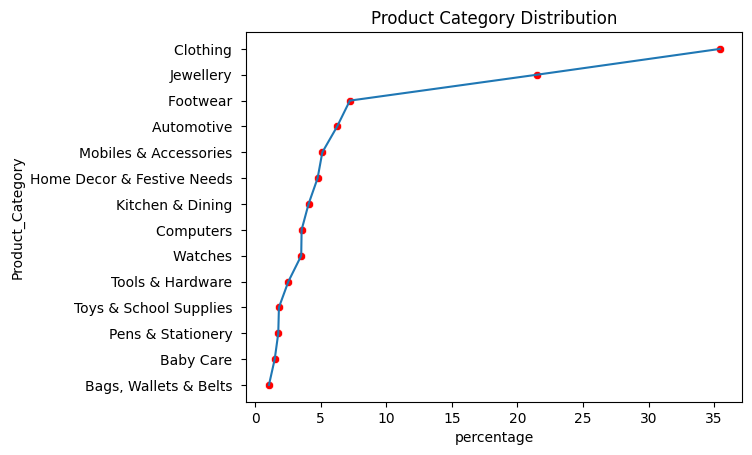

In [91]:
# plt.figure(figsize=(5,5))
sns.lineplot(SS_df,x='percentage',y='Product_Category',)
sns.scatterplot(SS_df,x='percentage',y='Product_Category',color='red')
plt.title('Product Category Distribution')
plt.show()

### Analysis:
* High Proportions: Categories like Clothing and Jewellery dominate the dataset with a significant percentage of the instances.
* Low Proportions: Categories such as Bags, Wallets & Belts and Baby Care have much lower proportions, indicating they are underrepresented.
* Imbalance: The chart clearly shows that some categories are heavily favored over others. This imbalance can impact machine learning models, as models may become biased towards the more frequent categories

## Split the data into training and testing sets by using the sklearn library and its train_test_split function

In [92]:

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=42)

print("Training set shape:", X_train.shape)
print("Testing set shape:", X_test.shape)

Training set shape: (11998,)
Testing set shape: (3000,)


# 6. Develop Machine Learning- Multi-class text classifier:

# logistc Regression

### using the smote here to treating the imbalce dataset treating

In [93]:
from imblearn.over_sampling import SMOTE
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from imblearn.pipeline import make_pipeline
model=LogisticRegression(max_iter=1000)
# Define pipeline, use make_pipeline to handle SMOTE correctly
smote_pipeline = make_pipeline(
    TfidfVectorizer(),
    SMOTE(random_state=42),
    model
)

# Train the model with SMOTE
smote_pipeline.fit(X_train, y_train)

# Evaluate
y_pred = smote_pipeline.predict(X_test)
print("SMOTE-Enhanced Model Report:")
print(classification_report(y_test, y_pred))

SMOTE-Enhanced Model Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       198
           1       0.85      0.86      0.85        51
           2       0.91      0.97      0.94        31
           3       0.99      0.99      0.99      1083
           4       0.94      0.95      0.95       107
           5       1.00      0.98      0.99       220
           6       0.98      0.99      0.98       154
           7       1.00      1.00      1.00       608
           8       0.95      0.98      0.97       114
           9       0.97      0.97      0.97       171
          10       0.84      0.88      0.86        41
          11       1.00      0.99      0.99        79
          12       0.86      0.79      0.83        48
          13       1.00      1.00      1.00        95

    accuracy                           0.98      3000
   macro avg       0.95      0.95      0.95      3000
weighted avg       0.98      0.98      0.98      30

# Hyper perameter tuning

In [94]:
from sklearn.model_selection import GridSearchCV
def hyper_p_tuning(X_train,y_train):
  # Define parameter grid
  param_grid = {
      'C': [0.1, 1, 10],
      'solver': ['liblinear', 'lbfgs']
  } # Initialize GridSearchCV
  grid_search = GridSearchCV(LogisticRegression(max_iter=1000), param_grid, cv=5, n_jobs=-1)
  grid_search.fit(X_train, y_train)
  # Best parameters and model
  print("Best Parameters:", grid_search.best_params_)
  best_model = grid_search.best_estimator_
  return best_model



In [95]:
X_trin1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.2, random_state=42)
best_model=hyper_p_tuning(X_trin1,y_train1)

Best Parameters: {'C': 10, 'solver': 'lbfgs'}


In [96]:
# Define pipeline, use make_pipeline to handle SMOTE correctly
best_model = make_pipeline(
    TfidfVectorizer(),
    SMOTE(random_state=42),
    LogisticRegression(max_iter=1000, C=10, solver='lbfgs')

)

# Train the model with SMOTE
best_model.fit(X_train, y_train)

Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('smote', SMOTE(random_state=42)),
                ('logisticregression',
                 LogisticRegression(C=10, max_iter=1000))])

In [97]:

# Predict and evaluate
y_pred = best_model.predict(X_test)

# Classification report
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.98      0.99      0.99       198
           1       0.85      0.86      0.85        51
           2       0.94      0.97      0.95        31
           3       0.99      0.99      0.99      1083
           4       0.95      0.97      0.96       107
           5       1.00      0.98      0.99       220
           6       0.98      0.99      0.98       154
           7       1.00      1.00      1.00       608
           8       0.95      0.98      0.97       114
           9       0.98      0.96      0.97       171
          10       0.82      0.90      0.86        41
          11       1.00      0.99      0.99        79
          12       0.88      0.77      0.82        48
          13       1.00      1.00      1.00        95

    accuracy                           0.98      3000
   macro avg       0.95      0.95      0.95      3000
weighted avg       0.98      0.98      0.98      3000



In [98]:
f1_score=metrics.f1_score(y_test,y_pred,average='weighted')
print("Logistic regression f1_score :",f1_score)

Logistic regression f1_score : 0.9826417786402776


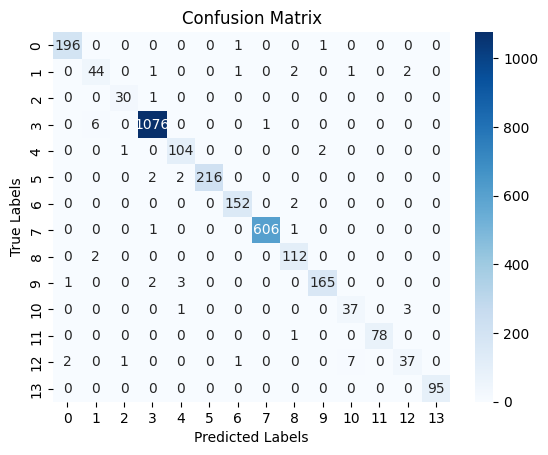

In [99]:
# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


In [100]:

op=open('model_log.pkl','wb')
pickle.dump(best_model,op)
op.close()

Testing for ml model

In [101]:
model=pickle.load(open('model_log.pkl','rb'))


In [102]:
# Load the label encoder
with open('label_encoder1.pkl', 'rb') as f:
    label_encoder = pickle.load(f)# test the model prediction
y_pred = model.predict(X_test)

# Convert probabilities to class labels
# y_pred_labels = np.argmax(y_pred, axis=1)


# Print predicted categories
predicted_categories = label_encoder.inverse_transform(y_pred)

print('Predicted Categories (Real Names):', predicted_categories)

Predicted Categories (Real Names): ['Clothing ' 'Pens & Stationery ' 'Kitchen & Dining ' ... 'Computers '
 'Baby Care ' 'Computers ']


# **USING THE TEST DATA HERE FOR MODEL TESTING**
* here we use the logistic model

In [107]:
df_test=pd.read_excel('/content/test_data.xlsx')
df_test.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,4fb99d98225f415e7ece96938e95628f,2015-12-20 08:26:17 +0000,http://www.flipkart.com/v-v-art-brass-bracelet...,V&V ART Brass Bracelet,BBAE6NYHCDTEZJTB,470.0,423.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,V&V ART Brass Bracelet - Buy V&V ART Brass Bra...,No rating available,No rating available,V&V ART,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,4ea284c8d38b2ea97a1c2a26f34e057c,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kalpaveda-copper-cuff/...,Kalpaveda Copper Copper Cuff,BBAEDFFKZJTY7SZZ,1200.0,1200.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,Kalpaveda Copper Copper Cuff\n ...,No rating available,No rating available,Kalpaveda,"{""product_specification""=>[{""key""=>""Stretchabl..."
2,ee6ce2c7045c54257e2a0b590e09c296,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-book-cove...,Thelostpuppy Book Cover for Apple iPad Air,ACCEA4DZH6M5SFVH,2199.0,599.0,"[""http://img5a.flixcart.com/image/cases-covers...",False,Thelostpuppy Book Cover for Apple iPad Air (Mu...,No rating available,No rating available,Thelostpuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
3,e797ba3b5f2e2d1fdc520e48486ab60e,2015-12-20 08:26:17 +0000,http://www.flipkart.com/riana-copper-bangle/p/...,Riana Copper Copper Bangle,BBAEAXFQHHMF3EYZ,2499.0,649.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Riana Copper Copper Bangle - Buy Riana Copper ...,5,5,Riana,"{""product_specification""=>[{""key""=>""Collection..."
4,f4d8d43858c8858c68d75ce07ac641c0,2015-12-20 08:26:17 +0000,http://www.flipkart.com/inox-jewelry-stainless...,Inox Jewelry Stainless Steel Cuff,BBAECH63WYDG6TE2,1629.0,1222.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,Inox Jewelry Stainless Steel Cuff\n ...,No rating available,No rating available,Inox Jewelry,"{""product_specification""=>[{""key""=>""Stretchabl..."


In [108]:
df_test['description']=df_test['description'].apply(clean_text)

In [109]:
test_x=df_test['description']

In [110]:
model=pickle.load(open('model_log.pkl','rb'))


In [111]:
# Load the label encoder
with open('label_encoder1.pkl', 'rb') as f:
    label_encoder = pickle.load(f)# test the model prediction
y_pred = model.predict(test_x)

# Convert probabilities to class labels
# y_pred_labels = np.argmax(y_pred, axis=1)


# Print predicted categories
predicted_categories = label_encoder.inverse_transform(y_pred)

result = pd.DataFrame(predicted_categories, columns=['predict_category'])
result.head()

,predict_category
0,Jewellery
1,Jewellery
2,Mobiles & Accessories
3,Jewellery
4,Jewellery


# Decision tree

In [61]:
# Train model
model = DecisionTreeClassifier()


In [64]:
# Define pipeline, use make_pipeline to handle SMOTE correctly
Decision_model = make_pipeline(
    TfidfVectorizer(),
    SMOTE(random_state=42),
    model

)

# Train the model with SMOTE
Decision_model.fit(X_train, y_train)

Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('smote', SMOTE(random_state=42)),
                ('decisiontreeclassifier', DecisionTreeClassifier())])

In [65]:
# Pridict and evaluate
y_pred = Decision_model.predict(X_test)

# Classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       198
           1       0.89      0.76      0.82        51
           2       0.79      0.71      0.75        31
           3       0.97      0.98      0.97      1083
           4       0.82      0.86      0.84       107
           5       0.95      0.90      0.93       220
           6       0.94      0.96      0.95       154
           7       0.98      0.99      0.98       608
           8       0.95      0.91      0.93       114
           9       0.96      0.94      0.95       171
          10       0.67      0.78      0.72        41
          11       0.96      0.99      0.97        79
          12       0.83      0.73      0.78        48
          13       0.98      0.99      0.98        95

    accuracy                           0.95      3000
   macro avg       0.90      0.89      0.90      3000
weighted avg       0.95      0.95      0.95      3000



In [67]:
f1_score=metrics.f1_score(y_test,y_pred,average='weighted')
print("Decision tree f1_score :",f1_score)

Decision tree f1_score : 0.9524571514113879


In [68]:
def hyper_p_tuning_d(X_train,y_train):
  # Define parameter grid for decision tree
  param_grid = {
      'max_depth': [None, 10, 20, 30],
      'min_samples_split': [2, 5, 10],
      'min_samples_leaf': [1, 2, 4]
  }
  # Initialize GridSearchCV
  grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1)
  grid_search.fit(X_train, y_train)
  # Best parameters and model
  print("Best Parameters:", grid_search.best_params_)
  best_model = grid_search.best_estimator_
  return best_model



In [112]:
hyper_p_tuning_d(X_trin1,y_train1)

Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2}


DecisionTreeClassifier()

In [113]:
# Define pipeline, use make_pipeline to handle SMOTE correctly
model = DecisionTreeClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2)
Decision_model = make_pipeline(
    TfidfVectorizer(),
    SMOTE(random_state=42),
    model

)

# Train the model with SMOTE
Decision_model.fit(X_train, y_train)

Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('smote', SMOTE(random_state=42)),
                ('decisiontreeclassifier', DecisionTreeClassifier())])

In [116]:
# Load the label encoder
with open('label_encoder1.pkl', 'rb') as f:
    label_encoder = pickle.load(f)# test the model prediction
y_pred = Decision_model.predict(test_x)

# Convert probabilities to class labels
# y_pred_labels = np.argmax(y_pred, axis=1)


# Print predicted categories
predicted_categories = label_encoder.inverse_transform(y_pred)

result = pd.DataFrame(predicted_categories, columns=['predict_category'])
result.head()

,predict_category
0,Jewellery
1,Jewellery
2,Mobiles & Accessories
3,Jewellery
4,Clothing


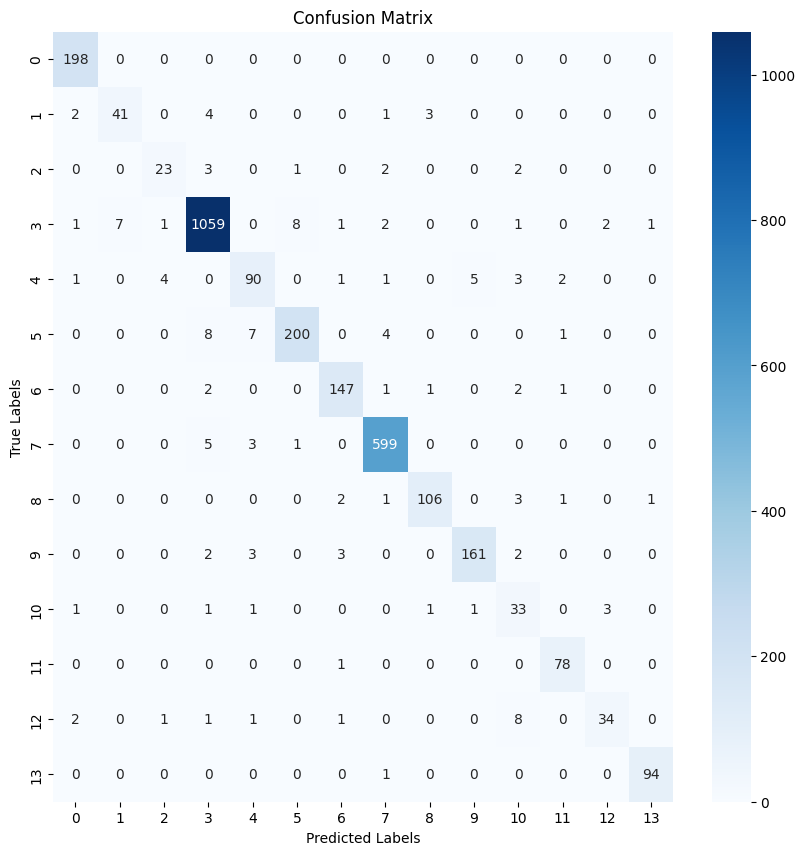

In [118]:
plt.figure(figsize=(10,10))
y_pred = Decision_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Random forest model

In [119]:
# Train model
model = RandomForestClassifier(n_estimators=100, random_state=42)
# Define pipeline, use make_pipeline to handle SMOTE correctly
rf_model = make_pipeline(
    TfidfVectorizer(),
    SMOTE(random_state=42),
    model

)

# Train the model with SMOTE
rf_model.fit(X_train, y_train)

Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('smote', SMOTE(random_state=42)),
                ('randomforestclassifier',
                 RandomForestClassifier(random_state=42))])

In [120]:
# Predict and evaluate
y_pred = rf_model.predict(X_test)

# Classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.99      0.98       198
           1       0.92      0.71      0.80        51
           2       0.89      0.81      0.85        31
           3       0.97      1.00      0.98      1083
           4       0.86      0.90      0.88       107
           5       0.99      0.94      0.96       220
           6       0.97      0.97      0.97       154
           7       1.00      0.99      0.99       608
           8       0.93      0.97      0.95       114
           9       0.97      0.98      0.98       171
          10       0.88      0.68      0.77        41
          11       1.00      0.99      0.99        79
          12       0.83      0.83      0.83        48
          13       1.00      0.99      0.99        95

    accuracy                           0.97      3000
   macro avg       0.94      0.91      0.92      3000
weighted avg       0.97      0.97      0.97      3000



In [121]:
f1_score=metrics.f1_score(y_test,y_pred,average='weighted')
print("Random forest f1_score :",f1_score)

Random forest f1_score : 0.9676743294701254


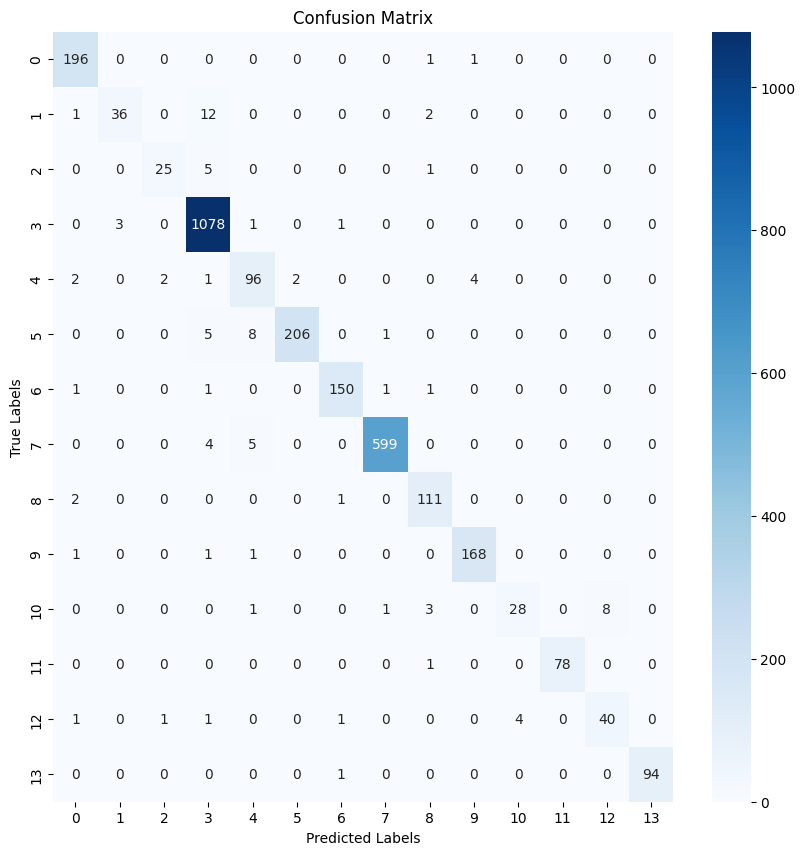

In [122]:
plt.figure(figsize=(10,10))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM, Bidirectional
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Deep learning model

#  Import Libraries for deep learning model


Import all the necessary libraries and modules needed for data manipulation, model building, and evaluation


* Sequential, Dense, Dropout, Embedding, LSTM, Bidirectional from TensorFlow/  Keras for building the neural network.
* Tokenizer and pad_sequences for text preprocessing

In [ ]:
# Load the dataset
df1 = pd.read_csv('/content/train_product_data.csv')
df1.head()


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,Footwear,SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
2,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
3,ce5a6818f7707e2cb61fdcdbba61f5ad,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVVKRBAXHB,1199.0,479.0,"[""http://img6a.flixcart.com/image/short/p/j/z/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,29c8d290caa451f97b1c32df64477a2c,2016-03-25 22:59:23 +0000,http://www.flipkart.com/dilli-bazaaar-bellies-...,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,SHOEH3DZBFR88SCK,699.0,349.0,"[""http://img6a.flixcart.com/image/shoe/b/p/n/p...",False,"Key Features of dilli bazaaar Bellies, Corpora...",No rating available,No rating available,dilli bazaaar,"{""product_specification""=>[{""key""=>""Occasion"",..."


## Data cleaning

In [ ]:
# Remove missing values
df1.dropna(subset=['description', 'product_category_tree'], inplace=True)
# Remove duplicates
df1.drop_duplicates(subset=['description'], inplace=True)
# Text normalization
df1['description'] = df1['description'].str.lower().str.replace('[^\w\s]', '')


## Tokenization and Padding:

* Convert text to sequences of integers.
* Pad sequences to ensure uniform input size

In [ ]:
# Tokenize the text data
tokenizer = Tokenizer(num_words=10000)  # Adjust num_words as needed
tokenizer.fit_on_texts(df1['description'])
X = tokenizer.texts_to_sequences(df1['description'])
X = pad_sequences(X, maxlen=100)  # Adjust maxlen as needed
op=open('tokenizer.pkl','wb')
pickle.dump(tokenizer,op)
op.close()


Distribution of the category into the dataset

# Label Encoding:

Convert categorical target labels to integers.

In [ ]:
#  df1 is  DataFrame and 'product_category_tree' is the column we're encoding
label_encoder = LabelEncoder()

# Fit the LabelEncoder on the specified column
y = label_encoder.fit_transform(df1['product_category_tree'])

# Save the fitted LabelEncoder to a file using pickle
with open('label_encoder2.pkl', 'wb') as f:
    pickle.dump(label_encoder, f)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# Apply SMOTE to balance the training set
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)



# model bulding

In [ ]:
model_deep=Sequential()
model_deep.add(Embedding(input_dim=10000,output_dim=128,input_length=100))
model_deep.add(Bidirectional(LSTM(64)))
model_deep.add(Dropout(0.5))
model_deep.add(Dense(64,activation='relu'))
model_deep.add(Dropout(0.5))
model_deep.add(Dense(len(label_encoder.classes_),activation='softmax'))


Sequential():
* This initializes a linear stack of layers. You can add layers to the model one by one. The output of one layer will be the input to the next layer.

## Embedding Layer

**Embedding():** This layer is used for turning positive integers (indexes) into dense vectors of fixed size. It's often used as the first layer in a model dealing with text data.

### Parameters

- **input_dim=10000:** The size of the vocabulary. In this case, it means we have 10,000 unique words in our vocabulary.
- **output_dim=128:** The size of the dense embedding vectors. Each word will be represented as a 128-dimensional vector.
- **input_length=100:** The length of input sequences. Each input sequence will be padded/truncated to this length.


## Bidirectional Wrapper

**Bidirectional():** This wrapper allows an RNN (like LSTM or GRU) to learn information from both the past and future by processing the input sequence in both forward and backward directions.

### Parameters

- **LSTM(64):** An LSTM (Long Short-Term Memory) layer with 64 units. LSTMs are a type of recurrent neural network (RNN) that can learn long-term dependencies. Using LSTM inside Bidirectional means we have one LSTM layer processing the sequence forward and another processing it backward, and their outputs are concatenated.


## Dropout Layer

**Dropout(0.5):** Dropout is a regularization technique used to prevent overfitting. It randomly sets a fraction of the input units to 0 at each update during training time, which helps in making the model robust. The fraction (0.5) means that 50% of the input units are set to 0.


## Dense Layer

**Dense(64):** A fully connected (dense) layer with 64 units. Each unit receives input from all units of the previous layer.

**activation='relu':** The ReLU (Rectified Linear Unit) activation function. It introduces non-linearity to the model, allowing it to learn more complex patterns. ReLU outputs 0 if the input is negative, and outputs the input itself if the input is positive.


**Dropout(0.5)**: Another dropout layer with a dropout rate of 50%. This helps further in reducing overfitting.

## Output Layer

**Dense(len(label_encoder.classes_)):** A dense layer with a number of units equal to the number of unique classes in your target variable (as given by `label_encoder.classes_`). This layer represents the output of the model.

**activation='softmax':** The softmax activation function. It is used in the output layer of a classification model to output a probability distribution over the classes. Each unit will output a probability value, and all these values will sum to 1, which allows the model to predict the class probabilities for the given input.


In [ ]:
model_deep.compile(loss='sparse_categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [ ]:
model_deep.fit(X_train_balanced,y_train_balanced,epochs=10,validation_data=(X_test,y_test))

Epoch 1/10
1642/1642 ━━━━━━━━━━━━━━━━━━━━ 423s 254ms/step - accuracy: 0.3615 - loss: 1.8532 - val_accuracy: 0.8477 - val_loss: 0.5524
Epoch 2/10
1642/1642 ━━━━━━━━━━━━━━━━━━━━ 362s 205ms/step - accuracy: 0.6560 - loss: 1.0567 - val_accuracy: 0.9210 - val_loss: 0.2907
Epoch 3/10
1642/1642 ━━━━━━━━━━━━━━━━━━━━ 329s 173ms/step - accuracy: 0.7119 - loss: 0.8840 - val_accuracy: 0.9267 - val_loss: 0.2609
Epoch 4/10
1642/1642 ━━━━━━━━━━━━━━━━━━━━ 292s 154ms/step - accuracy: 0.7518 - loss: 0.7641 - val_accuracy: 0.9385 - val_loss: 0.2312
Epoch 5/10
1642/1642 ━━━━━━━━━━━━━━━━━━━━ 279s 165ms/step - accuracy: 0.7809 - loss: 0.6785 - val_accuracy: 0.9202 - val_loss: 0.3326
Epoch 6/10
1642/1642 ━━━━━━━━━━━━━━━━━━━━ 301s 152ms/step - accuracy: 0.8046 - loss: 0.6076 - val_accuracy: 0.9316 - val_loss: 0.2804
Epoch 7/10
1642/1642 ━━━━━━━━━━━━━━━━━━━━ 259s 150ms/step - accuracy: 0.8268 - loss: 0.5464 - val_accuracy: 0.9427 - val_loss: 0.2927
Epoch 8/10
1642/1642 ━━━━━━━━━━━━━━━━━━━━ 249s 151ms/step - ac

In [ ]:
# test the model prediction
y_pred=model_deep.predict(X_test)

83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step


In [ ]:
# test the model prediction
y_pred=model_deep.predict(X_test)

# y_test are the true labels and y_pred are the predicted labels (probabilities)
y_pred_classes = np.argmax(y_pred, axis=1)  # Get the class with highest probability

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred_classes)
print("Accuracy:", accuracy)


83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step
Accuracy: 0.9399924041017851


In [ ]:
# test the model prediction
y_pred = model.predict(X_test)

# Convert probabilities to class labels
y_pred_labels = np.argmax(y_pred, axis=1)

# Calculate the F1 score


f1 = f1_score(y_test, y_pred_labels, average='weighted') # Use the imported f1_score function
print("Deep Learning Model F1-score:", f1)

83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step
Deep Learning Model F1-score: 0.9415216449344728


In [ ]:
# dump the model into a pkl file
op=open('model_deep_nlp1.pkl','wb')
pickle.dump(model_deep,op)
op.close()


# **Excel Using the test dataset**

In [ ]:
df_x=pd.read_excel('test_data.xlsx')
df_x.head()


,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,4fb99d98225f415e7ece96938e95628f,2015-12-20 08:26:17 +0000,http://www.flipkart.com/v-v-art-brass-bracelet...,V&V ART Brass Bracelet,BBAE6NYHCDTEZJTB,470.0,423.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,V&V ART Brass Bracelet - Buy V&V ART Brass Bra...,No rating available,No rating available,V&V ART,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,4ea284c8d38b2ea97a1c2a26f34e057c,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kalpaveda-copper-cuff/...,Kalpaveda Copper Copper Cuff,BBAEDFFKZJTY7SZZ,1200.0,1200.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,Kalpaveda Copper Copper Cuff\n ...,No rating available,No rating available,Kalpaveda,"{""product_specification""=>[{""key""=>""Stretchabl..."
2,ee6ce2c7045c54257e2a0b590e09c296,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-book-cove...,Thelostpuppy Book Cover for Apple iPad Air,ACCEA4DZH6M5SFVH,2199.0,599.0,"[""http://img5a.flixcart.com/image/cases-covers...",False,Thelostpuppy Book Cover for Apple iPad Air (Mu...,No rating available,No rating available,Thelostpuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
3,e797ba3b5f2e2d1fdc520e48486ab60e,2015-12-20 08:26:17 +0000,http://www.flipkart.com/riana-copper-bangle/p/...,Riana Copper Copper Bangle,BBAEAXFQHHMF3EYZ,2499.0,649.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Riana Copper Copper Bangle - Buy Riana Copper ...,5,5,Riana,"{""product_specification""=>[{""key""=>""Collection..."
4,f4d8d43858c8858c68d75ce07ac641c0,2015-12-20 08:26:17 +0000,http://www.flipkart.com/inox-jewelry-stainless...,Inox Jewelry Stainless Steel Cuff,BBAECH63WYDG6TE2,1629.0,1222.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,Inox Jewelry Stainless Steel Cuff\n ...,No rating available,No rating available,Inox Jewelry,"{""product_specification""=>[{""key""=>""Stretchabl..."


In [ ]:
# Text normalization
df_x['description'] = df_x['description'].str.lower().str.replace('[^\w\s]', '')


In [ ]:
# Tokenize the text data
tokenizer = Tokenizer(num_words=10000)  # Adjust num_words as needed
tokenizer.fit_on_texts(df_x['description'])
X = tokenizer.texts_to_sequences(df_x['description'])
X = pad_sequences(X, maxlen=100)  # Adjust maxlen as needed


In [ ]:
# import the nlp model here
model=pickle.load(open('/content/model_deep_nlp1.pkl','rb'))
y_pred=model.predict(X)

80/80 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step


In [ ]:
op=open('label_encoder2.pkl','rb')
label_encoder=pickle.load(op)
op.close()


In [ ]:
# test the model prediction
y_pred = model.predict(X_test)

# Convert probabilities to class labels
y_pred_labels = np.argmax(y_pred, axis=1)
# Print predicted categories
predicted_categories = label_encoder.inverse_transform(y_pred_labels)
print('Predicted Categories (Real Names):', predicted_categories)


83/83 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step
Predicted Categories (Real Names): ['Clothing ' 'Jewellery ' 'Baby Care ' ... 'Clothing ' 'Clothing '
 'Jewellery ']


In [ ]:
result = pd.DataFrame(predicted_categories, columns=['predict_category'])
result.head()

,predict_category
0,Clothing
1,Jewellery
2,Baby Care
3,Toys & School Supplies
4,Jewellery


# **EXTRA WORK**

# Deep Learning Models

# Step 1: Loading and Exploring the Dataset
### 1.1 Load the Dataset
The first step in any data science project is to load the data and understand its structure. This involves reading the dataset into a DataFrame and then inspecting it to get an idea of what the data looks like, what types of values it contains, and how it's structured.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Load the dataset
data = pd.read_csv('/content/train_product_data.csv')
data.head()


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,Footwear,SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
2,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
3,ce5a6818f7707e2cb61fdcdbba61f5ad,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVVKRBAXHB,1199.0,479.0,"[""http://img6a.flixcart.com/image/short/p/j/z/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,29c8d290caa451f97b1c32df64477a2c,2016-03-25 22:59:23 +0000,http://www.flipkart.com/dilli-bazaaar-bellies-...,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,SHOEH3DZBFR88SCK,699.0,349.0,"[""http://img6a.flixcart.com/image/shoe/b/p/n/p...",False,"Key Features of dilli bazaaar Bellies, Corpora...",No rating available,No rating available,dilli bazaaar,"{""product_specification""=>[{""key""=>""Occasion"",..."


In [ ]:
# Display basic information about the dataset
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  14999 non-null  object 
 1   crawl_timestamp          14999 non-null  object 
 2   product_url              14999 non-null  object 
 3   product_name             14999 non-null  object 
 4   product_category_tree    14999 non-null  object 
 5   pid                      14999 non-null  object 
 6   retail_price             14942 non-null  float64
 7   discounted_price         14942 non-null  float64
 8   image                    14996 non-null  object 
 9   is_FK_Advantage_product  14999 non-null  bool   
 10  description              14998 non-null  object 
 11  product_rating           14999 non-null  object 
 12  overall_rating           14999 non-null  object 
 13  brand                    10289 non-null  object 
 14  product_specifications

In [ ]:
data.shape

(14999, 15)

In [ ]:
data.describe()

,retail_price,discounted_price
count,14942.000000,14942.000000
mean,3128.424040,2087.732298
std,9154.463342,7712.247869
min,35.000000,35.000000
25%,699.000000,349.000000
50%,1000.000000,499.000000
75%,1989.750000,999.000000
max,571230.000000,571230.000000


# Step 2: Detecting Missing Data and Identifying Ambiguities
In this step, we'll check for missing values in the dataset and handle them appropriately. This is crucial as missing data can cause errors or reduce the performance of your machine learning models Deep learning.

* 2.1 Check for Missing Values
We'll start by checking which columns have missing values and how many missing values are present.

In [ ]:
# Check for missing values
missing_values = data.isnull().sum()/len(data)*100
missing_values


,0
uniq_id,0.000000
crawl_timestamp,0.000000
product_url,0.000000
product_name,0.000000
product_category_tree,0.000000
pid,0.000000
retail_price,0.380025
discounted_price,0.380025
image,0.020001
is_FK_Advantage_product,0.000000


In [ ]:
# Display columns with missing values
missing_values[missing_values > 0]


,0
retail_price,0.380025
discounted_price,0.380025
image,0.020001
description,0.006667
brand,31.402093
product_specifications,0.040003


In [ ]:
missing_columns = missing_values[missing_values > 0].index
missing_columns

Index(['retail_price', 'discounted_price', 'image', 'description', 'brand',
       'product_specifications'],
      dtype='object')

In [ ]:
data.drop(['brand','image'],axis=1,inplace=True)

In [ ]:
data[['description','product_specifications']].dropna(inplace=True)

In [ ]:
featurs_C=['product_category_tree','description','product_specifications']

In [ ]:
df=data[featurs_C]
df.head()

,product_category_tree,description,product_specifications
0,Clothing,Key Features of Alisha Solid Women's Cycling S...,"{""product_specification""=>[{""key""=>""Number of ..."
1,Footwear,Key Features of AW Bellies Sandals Wedges Heel...,"{""product_specification""=>[{""key""=>""Ideal For""..."
2,Clothing,Key Features of Alisha Solid Women's Cycling S...,"{""product_specification""=>[{""key""=>""Number of ..."
3,Clothing,Key Features of Alisha Solid Women's Cycling S...,"{""product_specification""=>[{""key""=>""Number of ..."
4,Footwear,"Key Features of dilli bazaaar Bellies, Corpora...","{""product_specification""=>[{""key""=>""Occasion"",..."


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 3 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   product_category_tree   14999 non-null  object
 1   description             14998 non-null  object
 2   product_specifications  14993 non-null  object
dtypes: object(3)
memory usage: 351.7+ KB


# Finding the duplicate values

In [ ]:
df.duplicated().sum()

301

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.duplicated().sum()

0

In [ ]:
# here firstly create a table values count and store in a varible
SS = df['product_category_tree'].value_counts()
# Convert to DataFrame by reset the index
SS_df = SS.reset_index()
SS_df.columns = ['Product_Category', 'Count']
# here we add the percentage columns for data distribution
SS_df['percentage']=round((SS_df['Count']/SS_df['Count'].sum())*100,2)
SS_df

,Product_Category,Count,percentage
0,Clothing,5107,34.75
1,Jewellery,3214,21.87
2,Footwear,1065,7.25
3,Automotive,937,6.38
4,Mobiles & Accessories,768,5.23
5,Home Decor & Festive Needs,670,4.56
6,Kitchen & Dining,610,4.15
7,Computers,531,3.61
8,Watches,526,3.58
9,Tools & Hardware,379,2.58


# 2. Visualize the Data:

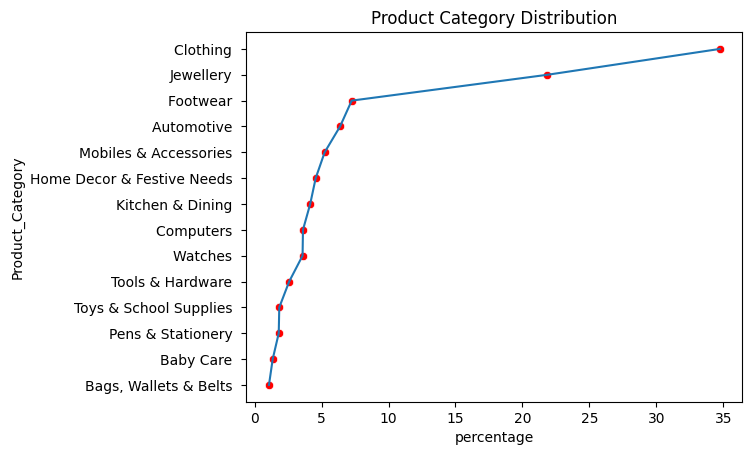

In [ ]:
# plt.figure(figsize=(5,5))
sns.lineplot(SS_df,x='percentage',y='Product_Category',)
sns.scatterplot(SS_df,x='percentage',y='Product_Category',color='red')
plt.title('Product Category Distribution')
plt.show()

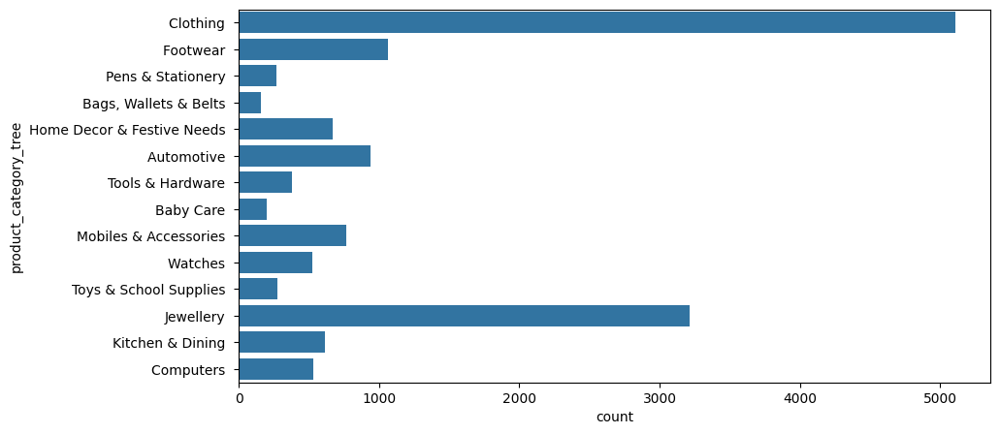

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(df['product_category_tree'])
plt.show()

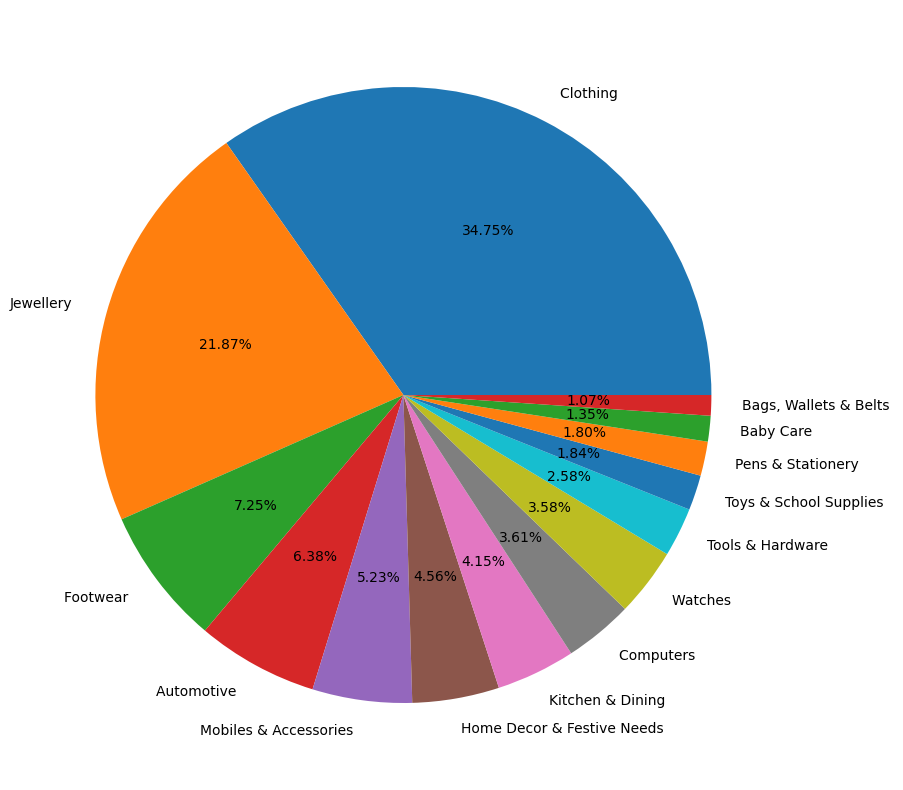

In [ ]:
plt.figure(figsize=(10,10))
plt.pie(df['product_category_tree'].value_counts(),labels=df['product_category_tree'].value_counts().index,autopct='%1.2f%%')
plt.show()

In [ ]:
cat_t=df['product_category_tree'].unique()
cat_t

array(['Clothing ', 'Footwear ', 'Pens & Stationery ',
       'Bags, Wallets & Belts ', 'Home Decor & Festive Needs ',
       'Automotive ', 'Tools & Hardware ', 'Baby Care ',
       'Mobiles & Accessories ', 'Watches ', 'Toys & School Supplies ',
       'Jewellery ', 'Kitchen & Dining ', 'Computers '], dtype=object)

In [ ]:
df.head()

,product_category_tree,description,product_specifications
0,Clothing,Key Features of Alisha Solid Women's Cycling S...,"{""product_specification""=>[{""key""=>""Number of ..."
1,Footwear,Key Features of AW Bellies Sandals Wedges Heel...,"{""product_specification""=>[{""key""=>""Ideal For""..."
2,Clothing,Key Features of Alisha Solid Women's Cycling S...,"{""product_specification""=>[{""key""=>""Number of ..."
3,Clothing,Key Features of Alisha Solid Women's Cycling S...,"{""product_specification""=>[{""key""=>""Number of ..."
4,Footwear,"Key Features of dilli bazaaar Bellies, Corpora...","{""product_specification""=>[{""key""=>""Occasion"",..."


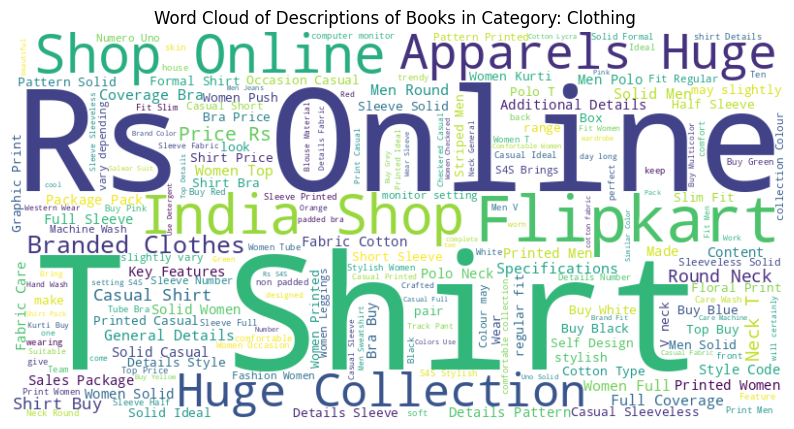

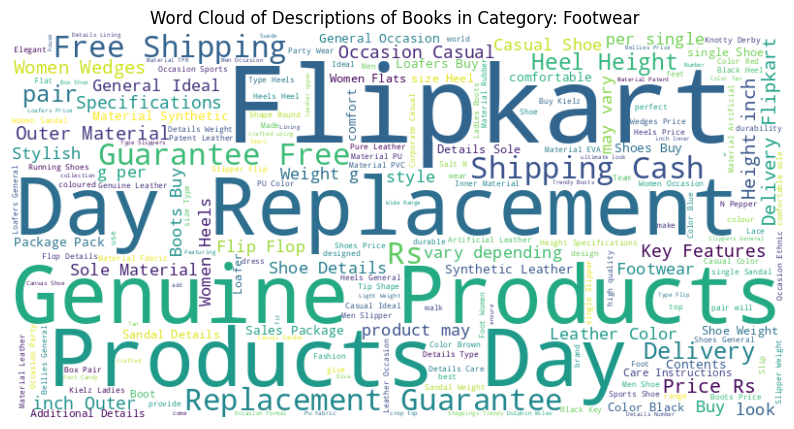

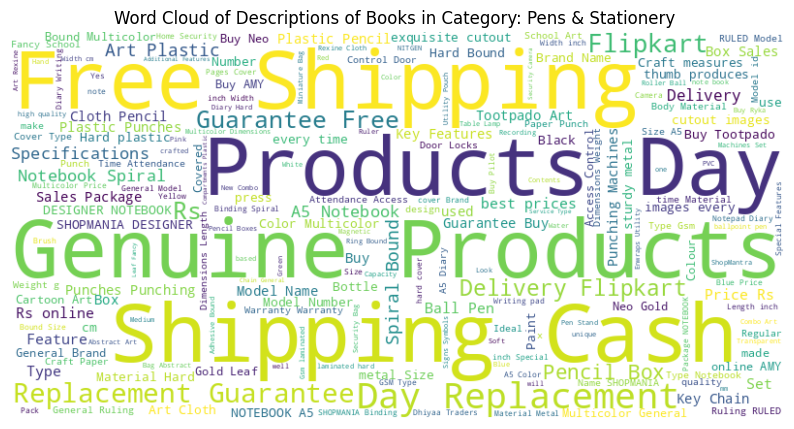

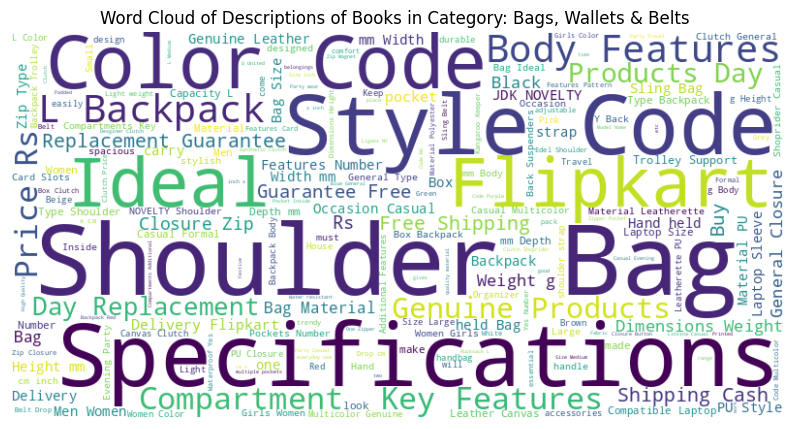

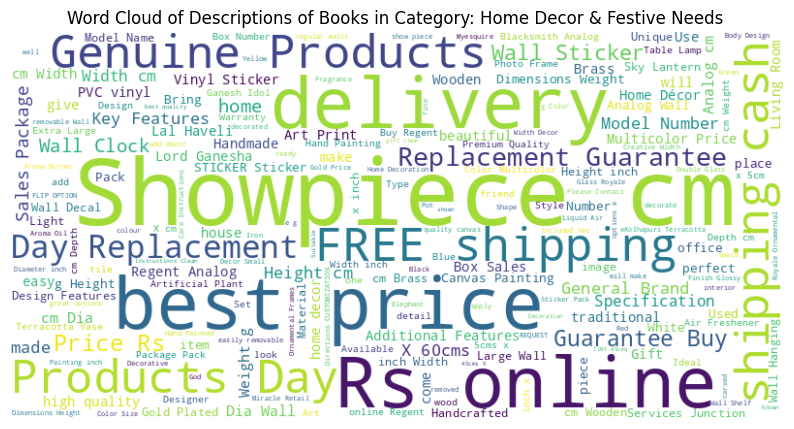

...

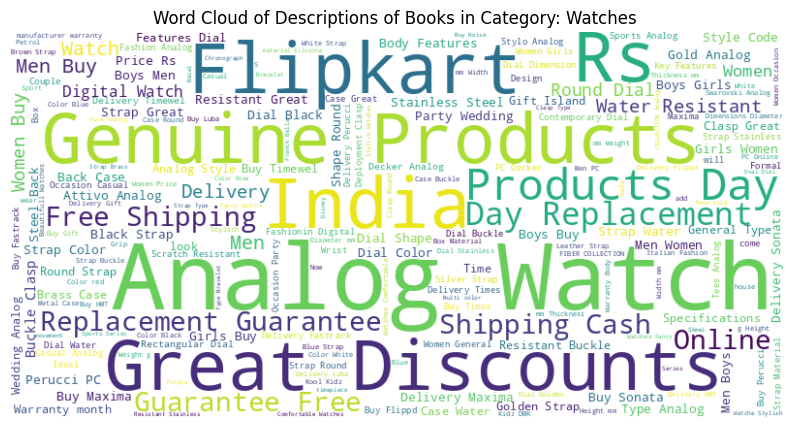

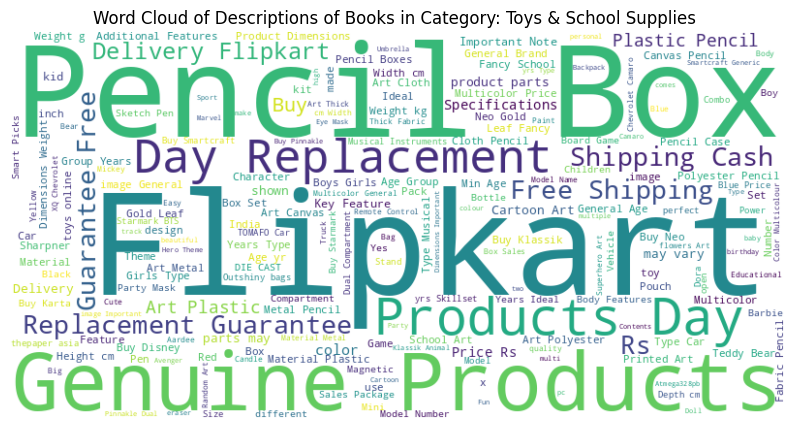

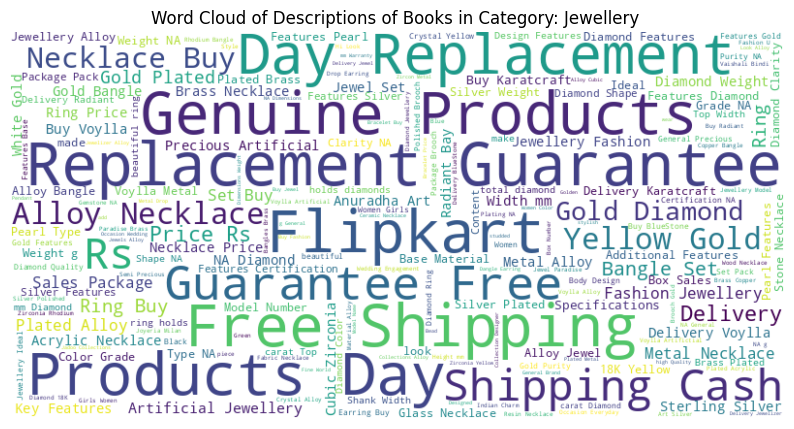

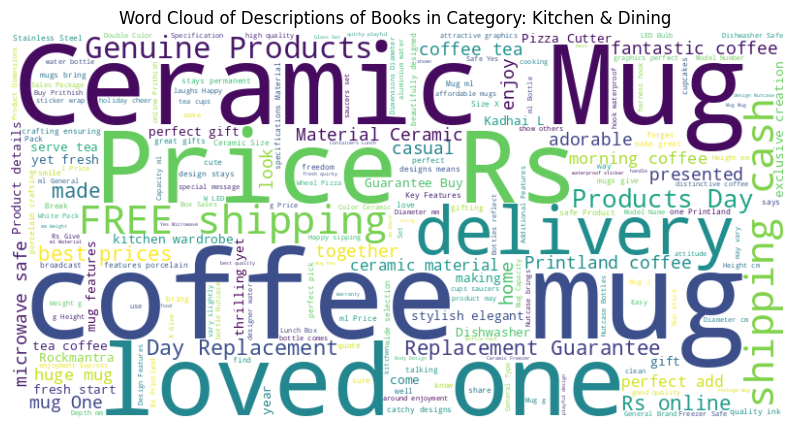

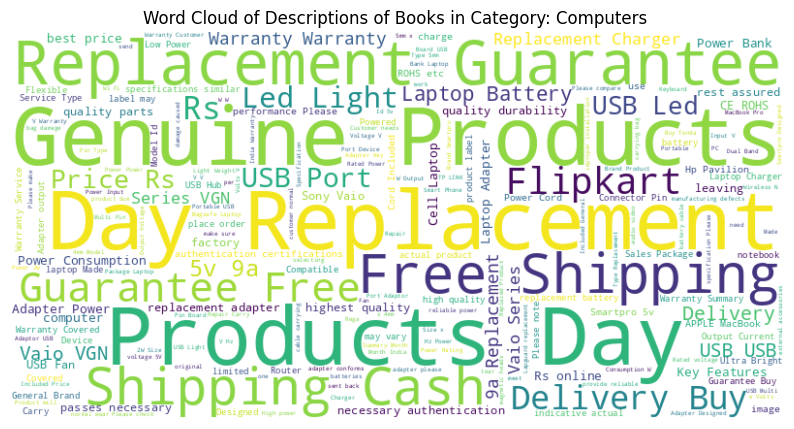

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Assuming 'cat_t' is a list of unique product categories
cat_t = df['product_category_tree'].unique()

for i in cat_t:
    # Word cloud for book descriptions in each category
    # Convert descriptions to strings, handling potential missing values
    all_text = ' '.join(df[df['product_category_tree'] == i]['description'].astype(str).fillna(''))
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)

    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud of Descriptions of Books in Category: {i}')
    plt.axis('off')
    plt.show()

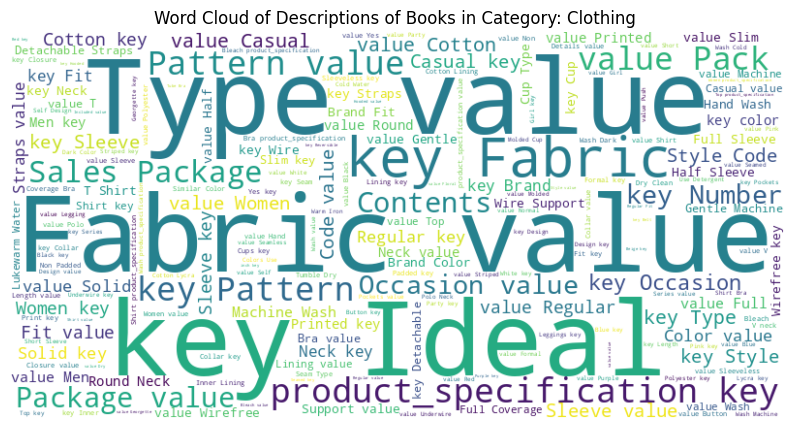

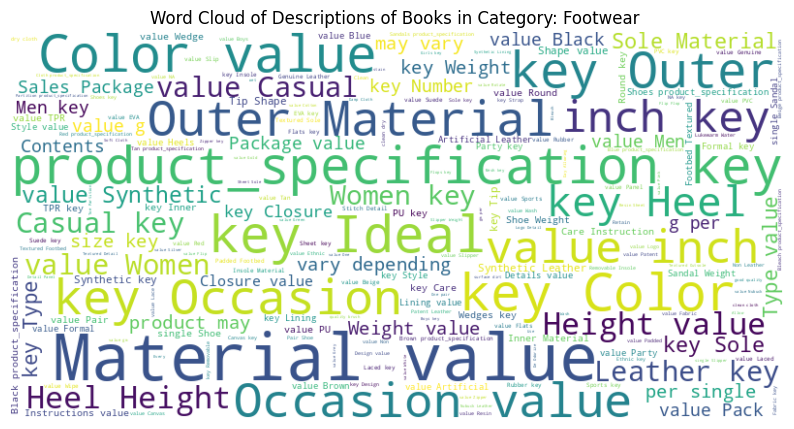

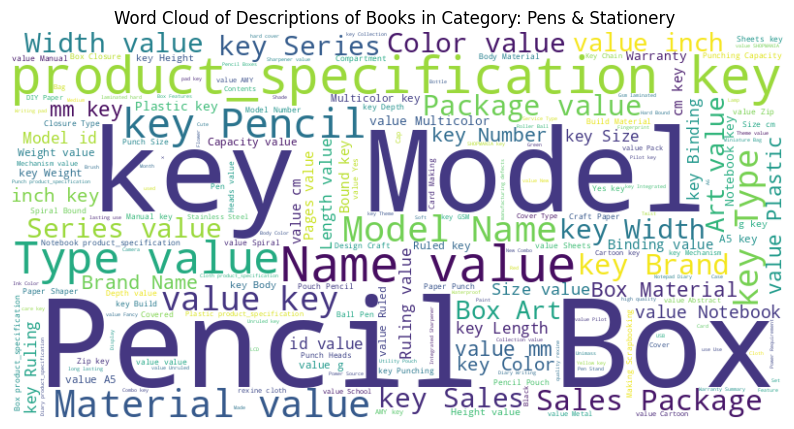

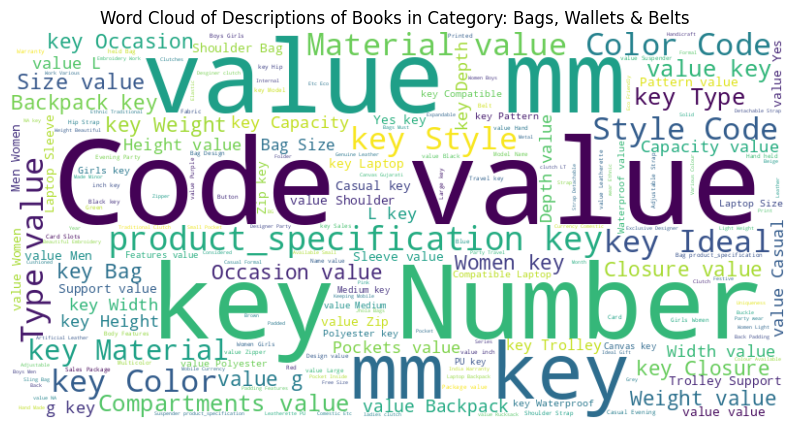

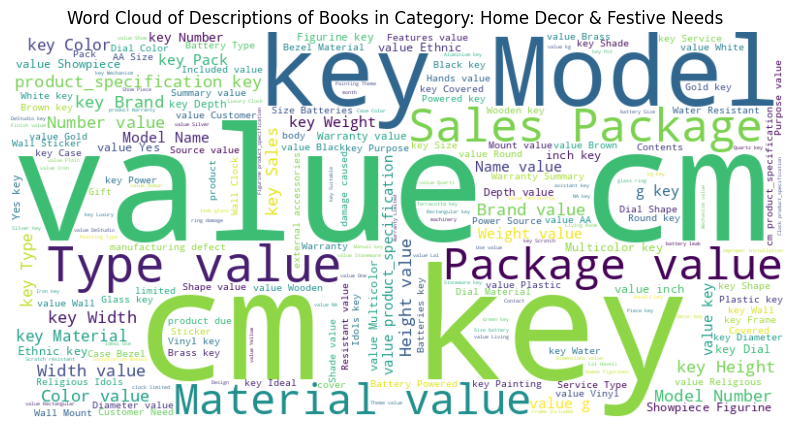

...

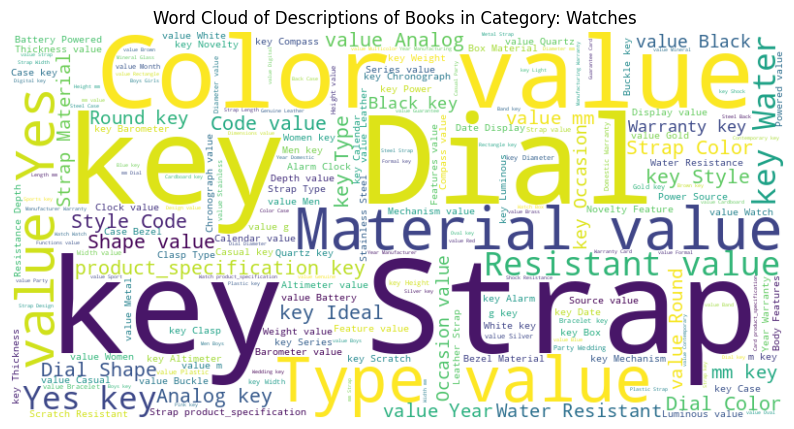

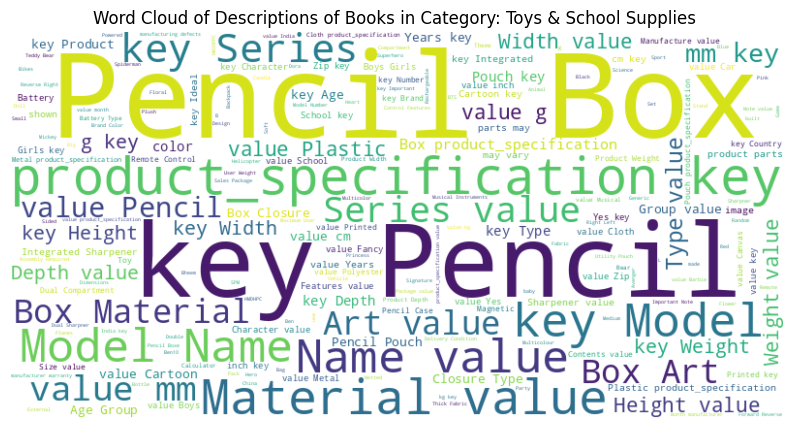

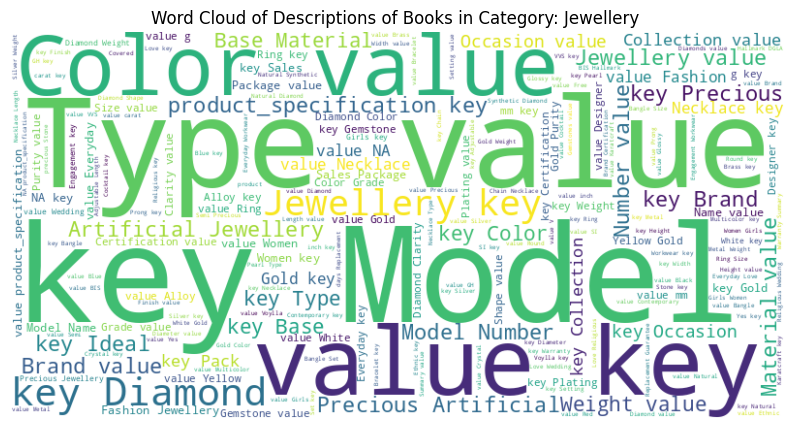

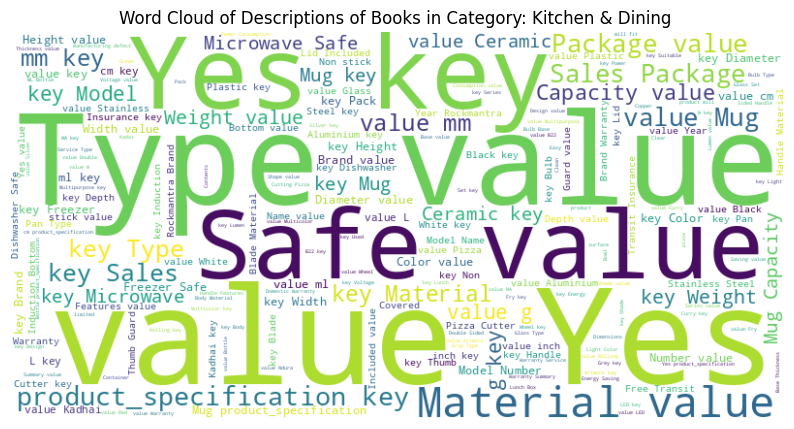

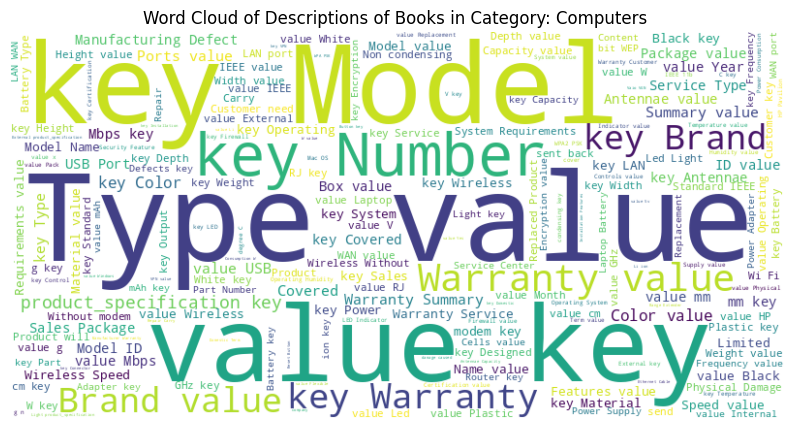

In [ ]:
for i in cat_t:
  all_text=' '.join(df[df['product_category_tree']==i]['product_specifications'].astype(str).fillna(''))
  wordcloud=WordCloud(width=800,height=400,background_color='white').generate(all_text)
  plt.figure(figsize=(10,6))
  plt.imshow(wordcloud,interpolation='bilinear')
  plt.title(f'Word Cloud of Descriptions of Books in Category: {i}')
  plt.axis('off')
  plt.show()

# 3 Data preprocessing

In [ ]:
import re
import spacy


In [ ]:
nlp = spacy.load('en_core_web_sm')


In [ ]:

def clean_text(text):
    """
    Clean and preprocess text using spaCy and regular expressions.

    Parameters:
    text (str): The input text to be cleaned.

    Returns:
    str: The cleaned and preprocessed text.
    """
    # Converting to lowercase
    text = text.lower()

    # Removing special characters
    text = re.sub(r'[^a-z\s]', '', text)

    # Handling empty strings
    if not text.strip():
        return ''

    # Using spaCy to lemmatize, remove stop words, and punctuations
    doc = nlp(text)
    tokens = [token.lemma_ for token in doc if not token.is_stop and not token.is_punct]
    cleaned_text = ' '.join(tokens)

    return cleaned_text




In [ ]:
#  Example usage:
sample_text = "Ashwani is Not, goOd' in EngliH SPeaKing!"
cleaned_sample_text = clean_text(sample_text)
print(cleaned_sample_text)

ashwani good englih speak


In [ ]:
df['description'].info()

<class 'pandas.core.series.Series'>
Index: 14698 entries, 0 to 14998
Series name: description
Non-Null Count  Dtype 
--------------  ----- 
14697 non-null  object
dtypes: object(1)
memory usage: 229.7+ KB


In [ ]:
df['description']=df['description'].apply(clean_text)

AttributeError: 'float' object has no attribute 'lower'

In [ ]:
df['product_specifications']=df['product_specifications'].apply(clean_text)